In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import datetime
from collections import Counter

In [2]:
mpl.style.use(['ggplot'])

In [3]:
df = pd.read_pickle("data/new_all.pkl")

In [4]:
def how_long(y, m, d):
    return (datetime.datetime.now() - datetime.datetime(y, m, d)).days

In [5]:
df["mean_donation"] = df.dotations_per_month / df.patrons
df.loc[df['patrons'] == 0, "mean_donation"] = np.NaN

In [6]:
df['profile_age_days'] = df.apply(lambda row: how_long(row['registration_year'], row['registration_month'], row['registration_day']), axis = 1)

df['registration_date'] = df.apply(lambda row: pd.to_datetime(datetime.date(row['registration_year'],
                                                                            row['registration_month'],
                                                                            row['registration_day'])), axis=1)

In [7]:
df.head(10)

,id,name,registration_year,registration_month,registration_day,patrons,dotations_per_month,total_dotations,tags,mean_donation,profile_age_days,registration_date
0,6,KOLOROFONIA,2015,9,14,50.0,1357.0,NaN,Muzyka|Sztuka|Edukacja,27.140000,1812,2015-09-14
0,35,Maciej Łukaszuk,2015,10,9,5.0,60.0,3590.0,Muzyka|YouTube,12.000000,1787,2015-10-09
0,86,Kaja Mikoszewska,2015,11,28,118.0,1945.0,NaN,Blog|YouTube|Podcast,16.483051,1737,2015-11-28
0,153,Współczesny polski komiks,2015,12,6,0.0,0.0,770.0,Komiks|Sztuka|Grafika,NaN,1729,2015-12-06
0,156,Jacek Wesołowski,2015,12,6,21.0,454.0,29017.0,Gry|Edukacja|Publicystyka,21.619048,1729,2015-12-06
0,212,Pracownia Cioci Kot,2016,6,19,NaN,100.0,3120.0,Komiks|Sztuka|Grafika,NaN,1533,2016-06-19
0,242,Astrofaza,2016,10,3,292.0,7725.0,NaN,Film|Edukacja|YouTube,26.455479,1427,2016-10-03
0,260,Piotr Kuldanek,2016,1,10,22.0,480.0,27425.0,Gry|Blog|Podcast,21.818182,1694,2016-01-10
0,327,Anna Kłosowska,2016,1,26,46.0,720.0,17810.0,Komiks|Grafika,15.652174,1678,2016-01-26
0,328,Razer,2016,10,4,12.0,310.0,14368.0,Podcast,25.833333,1426,2016-10-04


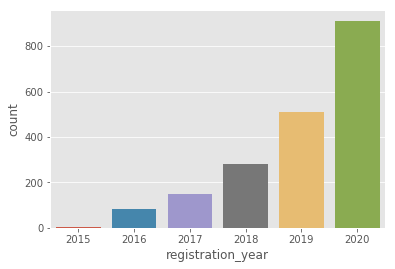

In [8]:
df_per_year = df.value_counts("registration_year").reset_index()
df_per_year.columns = ['registration_year', 'count']

sns.barplot(data=df_per_year, x="registration_year", y="count")

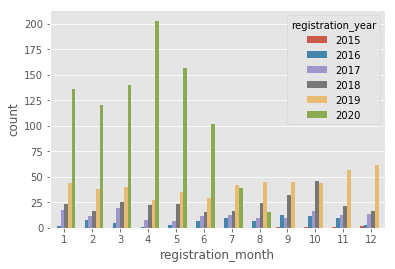

In [9]:
df_2020_month = df.value_counts(['registration_year', "registration_month"]).reset_index()
df_2020_month.columns = ['registration_year', 'registration_month', 'count']

sns.barplot(data=df_2020_month, x="registration_month", y="count", hue='registration_year')

In [10]:
df.sort_values("patrons", ascending=False).head(10)[['name', 'patrons']]

,name,patrons
0,Radio Nowy Świat,30733.0
0,Dariusz Rosiak,3203.0
0,Langusta na palmie,2243.0
0,Baniak Baniaka,2111.0
0,Sekielski Brothers Studio,1832.0
0,Studio Accantus,1734.0
0,Grupa Filmowa Darwin,1151.0
0,Dział Zagraniczny,1017.0
0,Pal Hajs TV,960.0
0,K3 podcast Dariusza Bugalskiego,647.0


In [11]:
df['patrons'].describe()

count     1709.000000
mean        48.582212
std        756.270710
min          0.000000
25%          0.000000
50%          4.000000
75%         16.000000
max      30733.000000
Name: patrons, dtype: float64

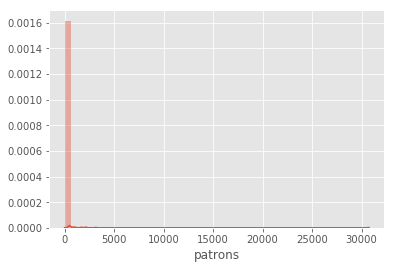

In [12]:
sns.distplot(df['patrons'])

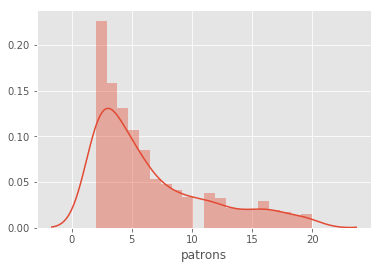

In [13]:
sns.distplot(df[df['patrons'].between(1, 20)]['patrons'], bins=20)

In [14]:
df[df['dotations_per_month'] != 0]['dotations_per_month'].describe()

count      1417.000000
mean       1265.329570
std       19734.606235
min           3.000000
25%          40.000000
50%         140.000000
75%         485.000000
max      735030.000000
Name: dotations_per_month, dtype: float64

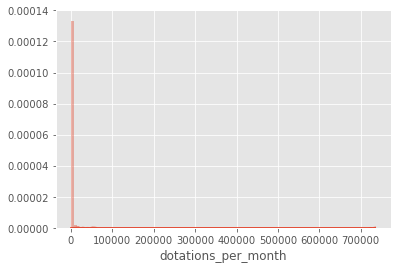

In [15]:
sns.distplot(df[df["dotations_per_month"] != 0]["dotations_per_month"], bins=100)
# plt.xscale('log')

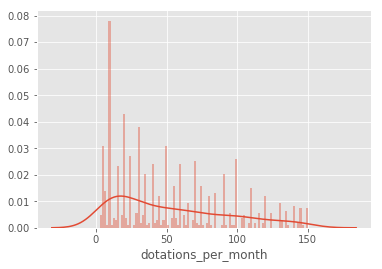

In [16]:
sns.distplot(df[df["dotations_per_month"].between(1, 150)]["dotations_per_month"], bins=100)

In [17]:
df.sort_values("dotations_per_month", ascending=False).head(10)[['name', 'dotations_per_month']]

,name,dotations_per_month
0,Radio Nowy Świat,735030.0
0,Sekielski Brothers Studio,57760.0
0,Langusta na palmie,54145.0
0,Dariusz Rosiak,52365.0
0,Grupa Filmowa Darwin,26168.0
0,Pal Hajs TV,18345.0
0,Halo.Radio – Pierwsze Medium Obywatelskie,15860.0
0,Dział Zagraniczny,15620.0
0,K3 podcast Dariusza Bugalskiego,12170.0
0,BezPlanu,10780.0


In [18]:
df.sort_values("total_dotations", ascending=False).head(10)[['name', 'total_dotations']]

,name,total_dotations
0,Radio Nowy Świat,3273998.0
0,Langusta na palmie,2151233.0
0,Sekielski Brothers Studio,2050375.0
0,Grupa Filmowa Darwin,1018610.0
0,Krzysztof Gonciarz,594630.0
0,Halo.Radio – Pierwsze Medium Obywatelskie,439260.0
0,Pal Hajs TV,429590.0
0,Dariusz Rosiak,297305.0
0,arhn.eu,285409.0
0,Uwaga Naukowy Bełkot,222107.0


In [19]:
df[df['total_dotations'] != 0]['total_dotations'].describe().astype(int)

count       1558
mean       13438
std       118446
min            5
25%          240
50%         1012
75%         4157
max      3273998
Name: total_dotations, dtype: int64

In [20]:
df.sort_values('patrons', ascending=False).head(10)[['name', 'patrons']]

,name,patrons
0,Radio Nowy Świat,30733.0
0,Dariusz Rosiak,3203.0
0,Langusta na palmie,2243.0
0,Baniak Baniaka,2111.0
0,Sekielski Brothers Studio,1832.0
0,Studio Accantus,1734.0
0,Grupa Filmowa Darwin,1151.0
0,Dział Zagraniczny,1017.0
0,Pal Hajs TV,960.0
0,K3 podcast Dariusza Bugalskiego,647.0


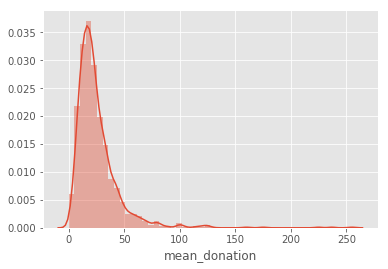

In [21]:
sns.distplot(df.mean_donation)

In [22]:
df[(df['mean_donation'] > 0) & ~pd.isna(df['mean_donation'])]['mean_donation'] .describe()

count    1199.000000
mean       25.583221
std        20.962376
min         2.333333
25%        14.000000
50%        20.500000
75%        30.645833
max       255.000000
Name: mean_donation, dtype: float64

In [23]:
df[df.mean_donation >= 100].sort_values('mean_donation', ascending=False).head(10)[['name', 'mean_donation']]

,name,mean_donation
0,Zespół Nowonarodzeni,255.000000
0,Armia Dzieci,236.750000
0,Artur Mendela,225.000000
0,Wędkuj z Julią,175.000000
0,Marianna Drozdowska,160.000000
0,JTElektronika,127.500000
0,Zaprojektuj Swoje Życie,124.318182
0,Fundacja Smile Together,123.947368
0,Kaer Morhen Forge,122.857143
0,Aga Vibes ASMR,120.000000


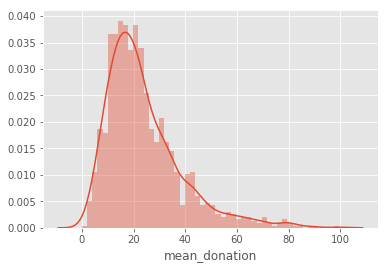

In [24]:
sns.distplot(df[df["mean_donation"] < 100]["mean_donation"], bins=50)

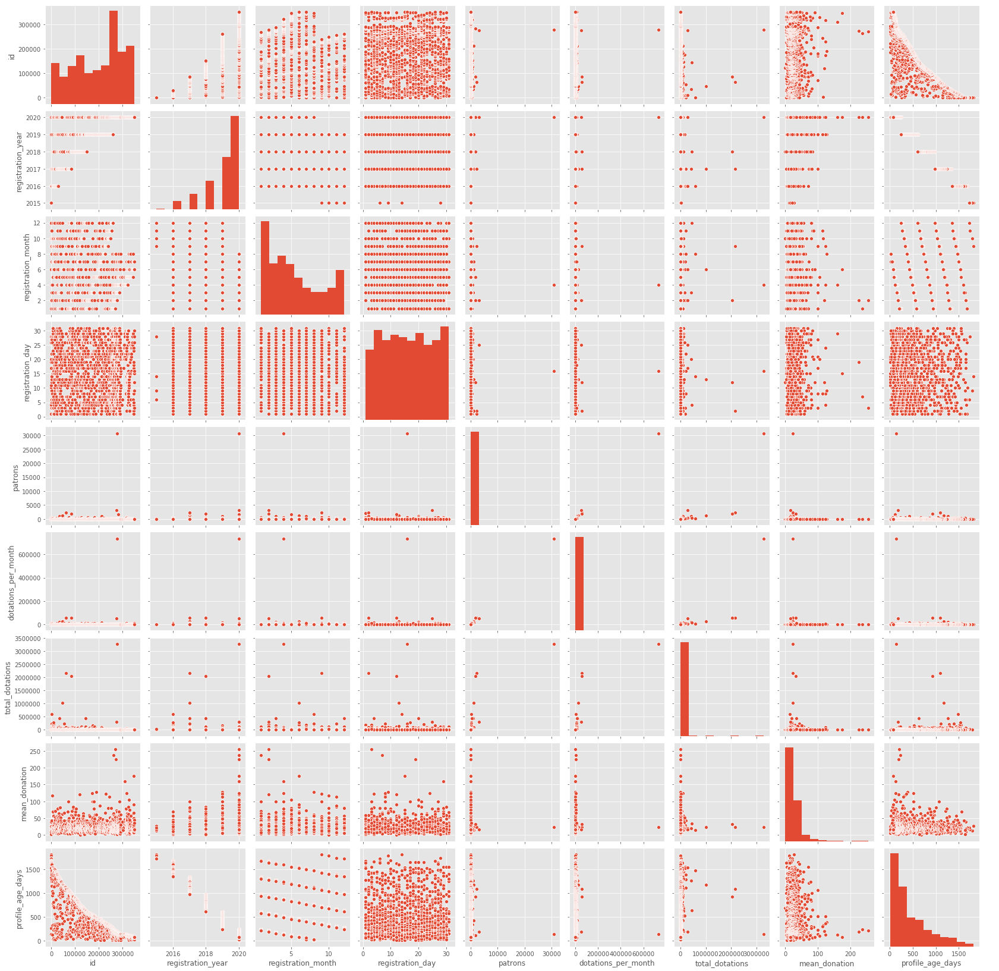

In [25]:
sns.pairplot(df)

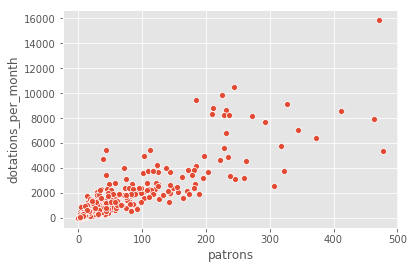

In [26]:
sns.scatterplot(data=df[df.patrons < 500], x='patrons', y='dotations_per_month')

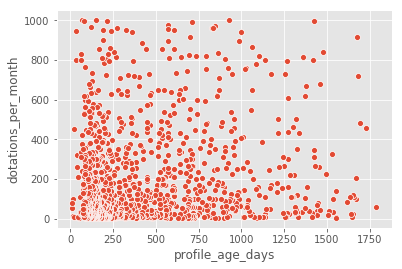

In [27]:
sns.scatterplot(data=df[df["dotations_per_month"].between(1, 1000)], x='profile_age_days', y='dotations_per_month')

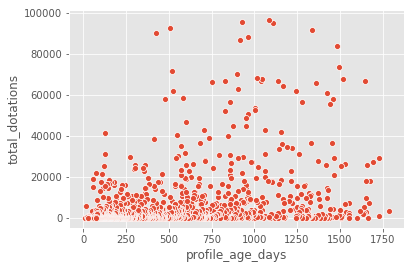

In [28]:
sns.scatterplot(data=df[df["total_dotations"] <= 100000], x='profile_age_days', y='total_dotations')

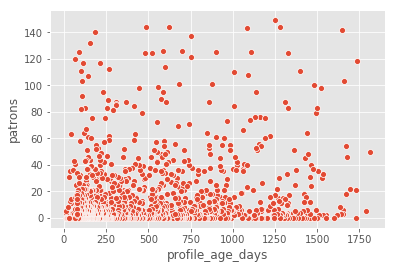

In [29]:
sns.scatterplot(data=df[df['patrons'] < 150], x='profile_age_days', y='patrons')

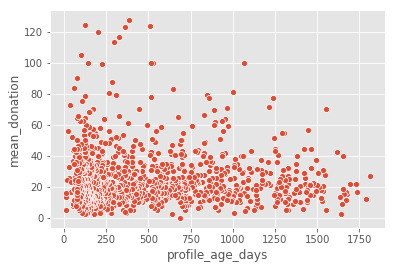

In [30]:
sns.scatterplot(data=df[df['mean_donation'] < 150], x='profile_age_days', y='mean_donation')

In [31]:
# najpopularniejsze tagi
df['tags_list'] = df['tags'].apply(lambda t: t.split("|"))


tag_list = [i for t in df['tags_list'] for i in t ]

tag_list_coll = dict(Counter(tag_list))

popular_tags = pd.DataFrame.from_dict(dict(sorted(tag_list_coll.items(), key=lambda x: x[1], reverse=True)), orient='index').reset_index()
popular_tags.columns = ['tag', 'count']

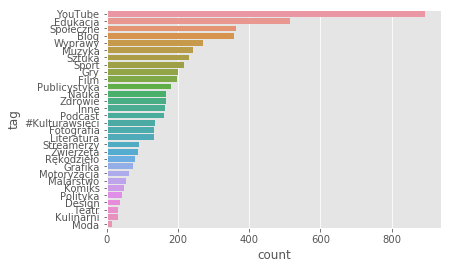

In [32]:
sns.barplot(data=popular_tags.nlargest(30, 'count'), x='count', y='tag')

In [33]:
# Pandas >= 0.25
df_tags = df.explode('tags_list')
df_tags_agg = df_tags.groupby('tags_list').aggregate({"patrons": "mean",
                                       "dotations_per_month": "mean",
                                       "total_dotations": "mean",
                                       "mean_donation": "mean"}).reset_index()


In [34]:
df_tags_agg.nlargest(10, 'patrons')[['tags_list', 'patrons']]

,tags_list,patrons
24,Publicystyka,271.577640
23,Polityka,187.525000
28,Sporty ekstremalne,177.428571
19,Muzyka,165.565421
31,Społeczne,125.510903
36,Teatr,115.678571
21,Piłka nożna,68.333333
22,Podcast,55.483221
6,Film,51.369942
39,YouTube,38.462594


In [35]:
df_tags_agg.nlargest(10, 'dotations_per_month')[['tags_list', 'dotations_per_month']]

,tags_list,dotations_per_month
24,Publicystyka,5671.033520
23,Polityka,3689.523810
28,Sporty ekstremalne,3626.125000
19,Muzyka,3425.142857
31,Społeczne,2601.617318
6,Film,1109.788660
36,Teatr,1067.562500
22,Podcast,997.645570
21,Piłka nożna,775.714286
38,Wyprawy,733.055970


In [36]:
df_tags_agg.nlargest(10, 'total_dotations')[['tags_list', 'total_dotations']]

,tags_list,total_dotations
28,Sporty ekstremalne,137384.000000
23,Polityka,73506.857143
24,Publicystyka,45647.508671
36,Teatr,34823.906250
6,Film,28020.206522
38,Wyprawy,17095.702703
19,Muzyka,16756.564103
12,Koszykówka,15682.500000
31,Społeczne,14241.384615
39,YouTube,13335.682521


In [37]:
df_tags_agg.nlargest(10, 'mean_donation')[['tags_list', 'mean_donation']]

,tags_list,mean_donation
27,Sporty Wodne,44.277778
28,Sporty ekstremalne,36.594470
2,Cosplay,33.824359
29,Sporty walki,31.979167
16,Malarstwo,31.664622
37,Workout,31.583333
19,Muzyka,30.372539
40,Zdrowie,29.382976
26,Sport,28.565624
31,Społeczne,27.849356


In [38]:
6.5/100 * np.sum(df.total_dotations)

1360947.6400000001

In [39]:
partonite_zarobki = df[['registration_year', 'total_dotations']].groupby('registration_year').aggregate("sum").reset_index()
partonite_zarobki['prowizja'] = round(6.5/100 * partonite_zarobki['total_dotations'], 2)
partonite_zarobki

,registration_year,total_dotations,prowizja
0,2015,33377.0,2169.50
1,2016,2566946.0,166851.49
2,2017,5952827.0,386933.76
3,2018,5097291.0,331323.92
4,2019,2455811.0,159627.72
5,2020,4831404.0,314041.26


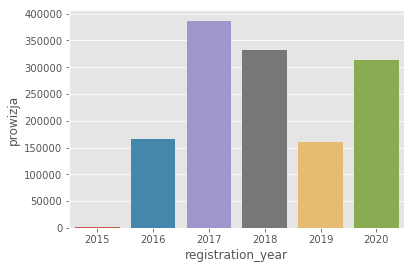

In [40]:
sns.barplot(data=partonite_zarobki, x='registration_year', y='prowizja')

In [41]:
# łącznie
round(np.sum(partonite_zarobki['prowizja']))

1360948

In [42]:
# miesięcznie
round(np.sum(partonite_zarobki['prowizja'])/(4*12))

28353